# TÉCNICAS DE CLUSTERIZAÇÃO PARA PAÍSES POR INDICADORES DE CRESCIMENTO VERDE E CONTEXTO SOCIOECONÔMICO A PARTIR DE DADOS DE 2019 DA OCDE

Matheus Santos Dias (diassmatheus@outlook.com)

#### Esse estudo se propõe a aplicar os algoritmos de clusterização k-means e agrupamento hierárquico aglomerativo, com o número de clusters definido a partir dos coeficientes de silhueta, para agrupar países de acordo com os indicadores de crescimento verde presentes na base de dados Green Growth da OCDE, com corte transversal para o ano de 2019, e por fim discutir os resultados levando em conta o contexto geopolítico dos países e os pontos de similaridades e de dissimilaridades entre cada cluster.

#### Conjunto de dados e descrição dos indicadores disponível em: https://www.oecd-ilibrary.org/environment/data/oecd-environment-statistics/green-growth-indicators_data-00665-en

### Etapas do KDD (descoberta de conhecimento em bancos de dados)

![](etapas_KDD.png)

### Fluxograma das tarefas realizadas nesse trabalho

![](fluxograma.jpg)

### Importação das bibliotecas e do dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
pd.set_option('display.precision', 3)
pd.set_option('float_format', '{:.3f}'.format)

In [3]:
df = pd.read_csv('GREEN_GROWTH_2019.csv')

In [4]:
df2019 = df[df.Year==2019]

In [5]:
df2019_pivoteado = pd.pivot_table(data=df2019, values='Value', columns='VAR', index='Country', aggfunc='sum')

In [6]:
df2019_pivoteado

VAR,AGRGDP_PC,BIRD_FARM,BIRD_FOR,CO2_AIRTRACAP,CO2_AIRTRAGDP,CO2_INTPROD,CO2_PBEM,CO2_PBEM00,CO2_PBEMCAP,CO2_PBPROD,...,POP_SWOMEN,PSE_FFS,RERD_ERD,RE_NRG,RE_TPES,RE_TPES_EBIOM,RN_MOR,RN_SC,SRVGDP_PC,TEMPCHANGE5180
Country,,,,,,,,,,,,,,,,,,,,,
ASEAN,11.407,nan,nan,102.020,8.383,nan,nan,nan,nan,nan,...,50.051,nan,nan,nan,nan,nan,3.912,0.042,51.383,nan
Afghanistan,22.175,nan,nan,5.876,2.828,nan,nan,nan,nan,nan,...,48.662,nan,nan,nan,nan,nan,1.992,0.020,54.648,0.893
Albania,21.424,nan,nan,15.303,1.150,nan,nan,nan,nan,nan,...,49.086,nan,nan,100.000,nan,nan,44.755,0.502,55.520,1.911
Algeria,12.562,nan,nan,28.792,2.430,nan,nan,nan,nan,nan,...,49.482,nan,nan,nan,nan,nan,2.528,0.028,48.190,1.224
American Samoa,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,6.280,nan,nan,1.502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wallis and Futuna,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.245
World,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,49.581,nan,nan,nan,nan,nan,10.854,0.118,nan,1.473
Yemen,nan,nan,nan,0.362,0.200,nan,nan,nan,nan,nan,...,49.618,nan,nan,nan,nan,nan,1.686,0.017,nan,nan


In [7]:
df2019_pivoteado.columns

Index(['AGRGDP_PC', 'BIRD_FARM', 'BIRD_FOR', 'CO2_AIRTRACAP', 'CO2_AIRTRAGDP',
       'CO2_INTPROD', 'CO2_PBEM', 'CO2_PBEM00', 'CO2_PBEMCAP', 'CO2_PBPROD',
       'COAL_FFS', 'CSE_ENET', 'CSE_FFS', 'CSE_TOTT', 'DMC_BIO', 'DMC_MET',
       'DMC_MIN', 'DMC_PROD', 'ELEC_FFS', 'ENVRD_GBAORD', 'ENVTAX_GDP',
       'ENVTAX_NRG', 'ENVTAX_TR', 'ENVTAX_VEH', 'EPRICE_IND', 'EPRICE_RES',
       'ERD_GDP', 'FFRD_ERD', 'FFS_TTAX', 'FIT_SOLAR', 'FIT_WIND',
       'FPRICE_DIE', 'FPRICE_PET', 'FTAX_DIE', 'FTAX_PET', 'GDP_R00',
       'GDP_RCAP', 'GSSE_FFS', 'INDGDP_PC', 'LTAX_GDP', 'LTAX_TTAX',
       'NATG_FFS', 'NRGS', 'NRG_I00', 'NRG_INT', 'NRG_PROD', 'O3_MOR', 'O3_SC',
       'ODA_BIO', 'ODA_CCADP', 'ODA_CCMIT', 'ODA_DES', 'ODA_ENV', 'ODA_ENVSEC',
       'ODA_RE', 'ODA_WATER', 'PA_MARINE', 'PA_TERRESTRIAL', 'PB_MOR', 'PB_SC',
       'PEST_AGLAND', 'PET_FFS', 'PM_MOR', 'PM_PWM', 'PM_SC', 'PM_SPEX10',
       'PM_SPEX35', 'POP', 'POPDEN', 'POP_A0014', 'POP_A1564', 'POP_A65UP',
       'POP_FERTILITY',

### Verificando os dados faltantes

In [8]:
df2019_pivoteado.isna().sum()

VAR
AGRGDP_PC          98
BIRD_FARM         222
BIRD_FOR          226
CO2_AIRTRACAP      68
CO2_AIRTRAGDP      70
                 ... 
RE_TPES_EBIOM     196
RN_MOR             29
RN_SC              38
SRVGDP_PC          98
TEMPCHANGE5180     29
Length: 85, dtype: int64

In [9]:
df2019_pivoteado.isna().sum().sum()

12189

<AxesSubplot:xlabel='VAR', ylabel='Country'>

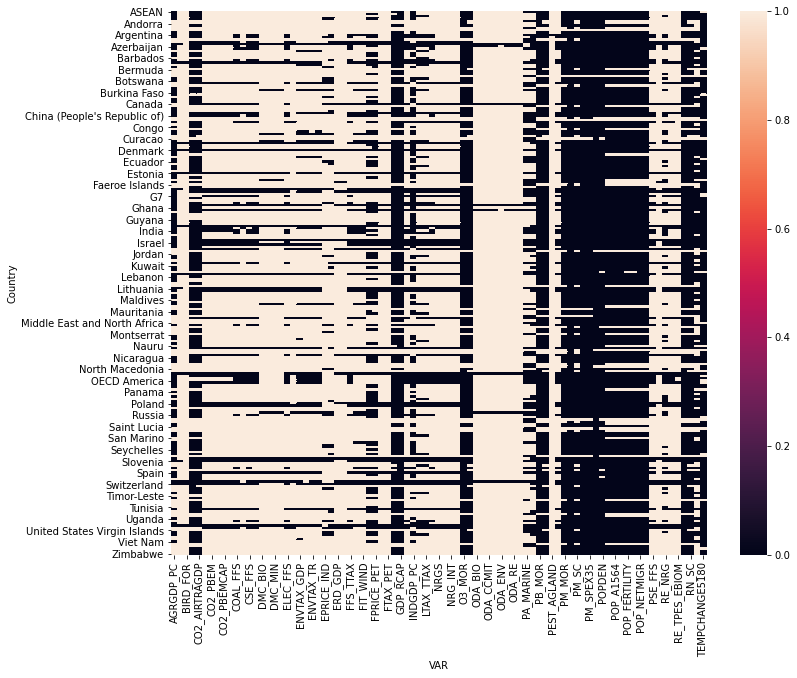

In [10]:
plt.figure(figsize=(12,10))
sns.heatmap(df2019_pivoteado.isna())

### Critério de exclusão de atributos: Se a quantidade de dados válidos por atributo for inferior à 60% do total de instâncias o atributo em questão será excluído.
#### Total: 236 instâncias 
#### 60%: 142 dados faltantes

In [11]:
df2019_pivoteado.dropna(axis=1, thresh=142, inplace=True)

In [12]:
df2019_pivoteado.isna().sum()

VAR
CO2_AIRTRACAP     68
CO2_AIRTRAGDP     70
GDP_R00           42
GDP_RCAP          38
O3_MOR            29
O3_SC             38
PB_MOR            29
PB_SC             38
PM_MOR            29
PM_PWM             9
PM_SC             38
PM_SPEX10          9
PM_SPEX35          9
POP                7
POPDEN            15
POP_A0014         37
POP_A1564         37
POP_A65UP         37
POP_FERTILITY     38
POP_LIFEEXP       38
POP_NETMIGR       37
POP_SWOMEN        37
RN_MOR            29
RN_SC             38
TEMPCHANGE5180    29
dtype: int64

<AxesSubplot:xlabel='VAR', ylabel='Country'>

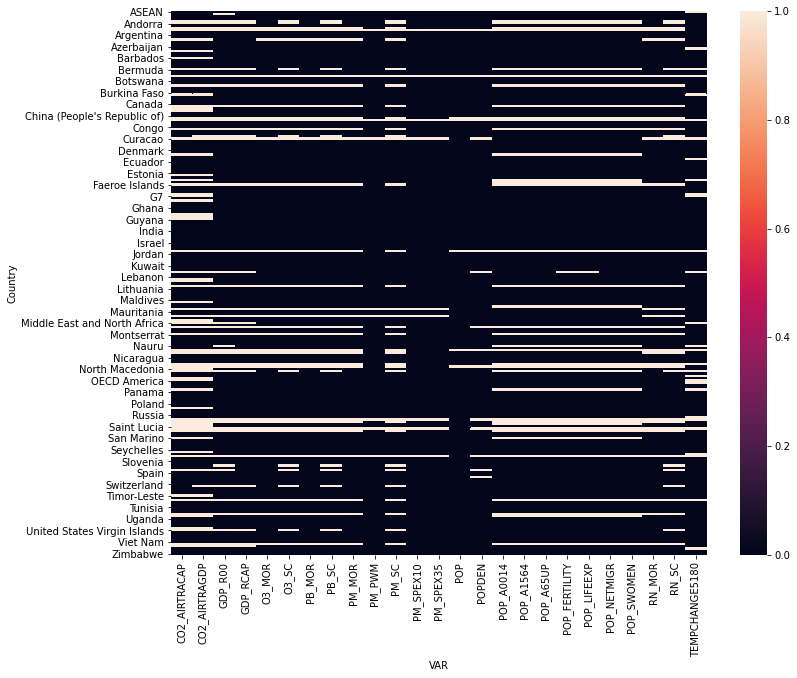

In [13]:
plt.figure(figsize=(12,10))
sns.heatmap(df2019_pivoteado.isna())

In [14]:
df2019_pivoteado

VAR,CO2_AIRTRACAP,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,O3_SC,PB_MOR,PB_SC,PM_MOR,PM_PWM,...,POP_A0014,POP_A1564,POP_A65UP,POP_FERTILITY,POP_LIFEEXP,POP_NETMIGR,POP_SWOMEN,RN_MOR,RN_SC,TEMPCHANGE5180
Country,,,,,,,,,,,,,,,,,,,,,
ASEAN,102.020,8.383,261.556,12170.360,13.702,0.144,75.999,0.748,377.556,21.223,...,25.402,67.691,6.907,2.174,72.662,-1580.638,50.051,3.912,0.042,nan
Afghanistan,5.876,2.828,nan,2077.427,12.496,0.126,224.978,2.261,228.234,52.998,...,42.375,55.006,2.618,4.273,64.957,-308.761,48.662,1.992,0.020,0.893
Albania,15.303,1.150,214.599,13311.800,8.324,0.093,175.375,1.969,532.035,18.460,...,17.523,68.189,14.288,1.590,78.611,-69.998,49.086,44.755,0.502,1.911
Algeria,28.792,2.430,183.638,11847.530,14.315,0.157,90.620,0.993,502.327,32.916,...,30.400,63.019,6.581,2.946,76.956,-50.002,49.482,2.528,0.028,1.224
American Samoa,nan,nan,nan,nan,6.174,nan,8.520,nan,140.150,6.350,...,nan,nan,nan,nan,nan,nan,nan,6.280,nan,1.502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wallis and Futuna,nan,nan,nan,nan,nan,nan,nan,nan,nan,6.578,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.245
World,nan,nan,nan,nan,47.359,0.513,116.927,1.266,536.966,42.531,...,25.587,65.290,9.124,2.448,72.633,0.002,49.581,10.854,0.118,1.473
Yemen,0.362,0.200,90.514,1811.789,10.851,0.109,233.607,2.348,386.895,44.645,...,39.170,57.923,2.906,3.673,66.194,-150.000,49.618,1.686,0.017,nan


### Excluindo instâncias que não sejam países

In [15]:
df2019_pivoteado.drop('ASEAN', axis=0, inplace=True)

In [16]:
df2019_pivoteado.drop('BRIICS economies - Brazil, Russia, India, Indonesia, China and South Africa', axis=0, inplace=True)

In [17]:
df2019_pivoteado.drop('Eastern Europe, Caucasus and Central Asia', axis=0, inplace=True)

In [18]:
df2019_pivoteado.drop('Euro area (19 countries)', axis=0, inplace=True)

In [19]:
df2019_pivoteado.drop('European Union (28 countries)', axis=0, inplace=True)

In [20]:
df2019_pivoteado.drop('G20', axis=0, inplace=True)

In [21]:
df2019_pivoteado.drop('G7', axis=0, inplace=True)

In [22]:
df2019_pivoteado.drop('Latin America and Caribbean', axis=0, inplace=True)

In [23]:
df2019_pivoteado.drop('Middle East and North Africa', axis=0, inplace=True)

In [24]:
df2019_pivoteado.drop('OECD - Europe', axis=0, inplace=True)

In [25]:
df2019_pivoteado.drop('OECD - Total', axis=0, inplace=True)

In [26]:
df2019_pivoteado.drop('OECD America', axis=0, inplace=True)

In [27]:
df2019_pivoteado.drop('OECD Asia Oceania', axis=0, inplace=True)

In [28]:
df2019_pivoteado.drop('World', axis=0, inplace=True)

In [29]:
df2019_pivoteado

VAR,CO2_AIRTRACAP,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,O3_SC,PB_MOR,PB_SC,PM_MOR,PM_PWM,...,POP_A0014,POP_A1564,POP_A65UP,POP_FERTILITY,POP_LIFEEXP,POP_NETMIGR,POP_SWOMEN,RN_MOR,RN_SC,TEMPCHANGE5180
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,5.876,2.828,nan,2077.427,12.496,0.126,224.978,2.261,228.234,52.998,...,42.375,55.006,2.618,4.273,64.957,-308.761,48.662,1.992,0.020,0.893
Albania,15.303,1.150,214.599,13311.800,8.324,0.093,175.375,1.969,532.035,18.460,...,17.523,68.189,14.288,1.590,78.611,-69.998,49.086,44.755,0.502,1.911
Algeria,28.792,2.430,183.638,11847.530,14.315,0.157,90.620,0.993,502.327,32.916,...,30.400,63.019,6.581,2.946,76.956,-50.002,49.482,2.528,0.028,1.224
American Samoa,nan,nan,nan,nan,6.174,nan,8.520,nan,140.150,6.350,...,nan,nan,nan,nan,nan,nan,nan,6.280,nan,1.502
Andorra,nan,nan,nan,nan,39.876,nan,35.864,nan,136.917,9.513,...,nan,nan,nan,nan,nan,nan,nan,34.763,nan,1.871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,66.725,8.754,328.487,7621.996,13.680,0.161,76.157,0.898,388.530,20.195,...,23.162,69.204,7.634,2.041,75.472,-425.631,50.083,5.384,0.063,1.841
Wallis and Futuna,nan,nan,nan,nan,nan,nan,nan,nan,nan,6.578,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.245
Yemen,0.362,0.200,90.514,1811.789,10.851,0.109,233.607,2.348,386.895,44.645,...,39.170,57.923,2.906,3.673,66.194,-150.000,49.618,1.686,0.017,nan


<AxesSubplot:xlabel='VAR', ylabel='Country'>

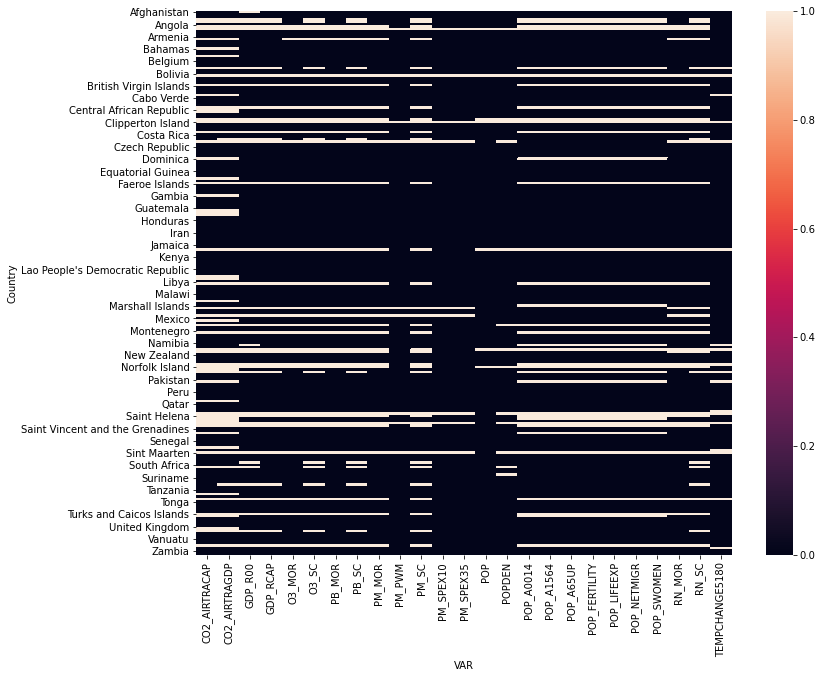

In [30]:
plt.figure(figsize=(12,10))
sns.heatmap(df2019_pivoteado.isna())

### Critério de exclusão de instâncias: manter pelo menos 150 países, com o mínimo de dados faltantes possível e evitando a exclusão dos países com maior PIB.

In [31]:
df2019_pivoteado.dropna(axis=0, thresh=23, inplace=True)

In [34]:
df2019_pivoteado

VAR,CO2_AIRTRACAP,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,O3_SC,PB_MOR,PB_SC,PM_MOR,PM_PWM,...,POP_A0014,POP_A1564,POP_A65UP,POP_FERTILITY,POP_LIFEEXP,POP_NETMIGR,POP_SWOMEN,RN_MOR,RN_SC,TEMPCHANGE5180
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,5.876,2.828,nan,2077.427,12.496,0.126,224.978,2.261,228.234,52.998,...,42.375,55.006,2.618,4.273,64.957,-308.761,48.662,1.992,0.020,0.893
Albania,15.303,1.150,214.599,13311.800,8.324,0.093,175.375,1.969,532.035,18.460,...,17.523,68.189,14.288,1.590,78.611,-69.998,49.086,44.755,0.502,1.911
Algeria,28.792,2.430,183.638,11847.530,14.315,0.157,90.620,0.993,502.327,32.916,...,30.400,63.019,6.581,2.946,76.956,-50.002,49.482,2.528,0.028,1.224
Angola,19.514,3.212,274.372,6075.285,4.721,0.057,38.282,0.459,174.547,28.022,...,46.520,51.274,2.206,5.415,61.214,19.240,50.527,2.092,0.025,1.694
Antigua and Barbuda,534.422,23.983,152.160,22282.910,0.010,0.000,61.534,0.654,309.069,17.620,...,21.989,68.904,9.107,1.980,77.079,0.000,51.757,2.583,0.027,0.827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,18.202,2.755,49.986,6607.628,5.963,0.072,114.658,1.384,430.519,22.215,...,27.496,64.867,7.636,2.243,72.212,-1309.495,50.746,9.444,0.114,1.194
Viet Nam,66.725,8.754,328.487,7621.996,13.680,0.161,76.157,0.898,388.530,20.195,...,23.162,69.204,7.634,2.041,75.472,-425.631,50.083,5.384,0.063,1.841
Yemen,0.362,0.200,90.514,1811.789,10.851,0.109,233.607,2.348,386.895,44.645,...,39.170,57.923,2.906,3.673,66.194,-150.000,49.618,1.686,0.017,nan


<AxesSubplot:xlabel='VAR', ylabel='Country'>

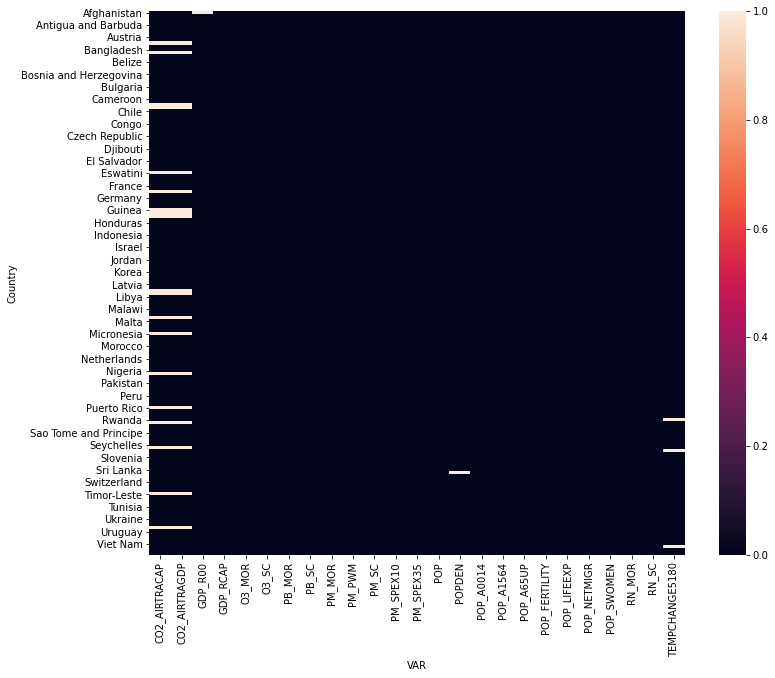

In [35]:
plt.figure(figsize=(12,10))
sns.heatmap(df2019_pivoteado.isna())

### Análise e exclusão de correlações fortes entre os atributos

#### Não manter correlações superiores a 0,7 ou inferiores a -0,7

<AxesSubplot:xlabel='VAR', ylabel='VAR'>

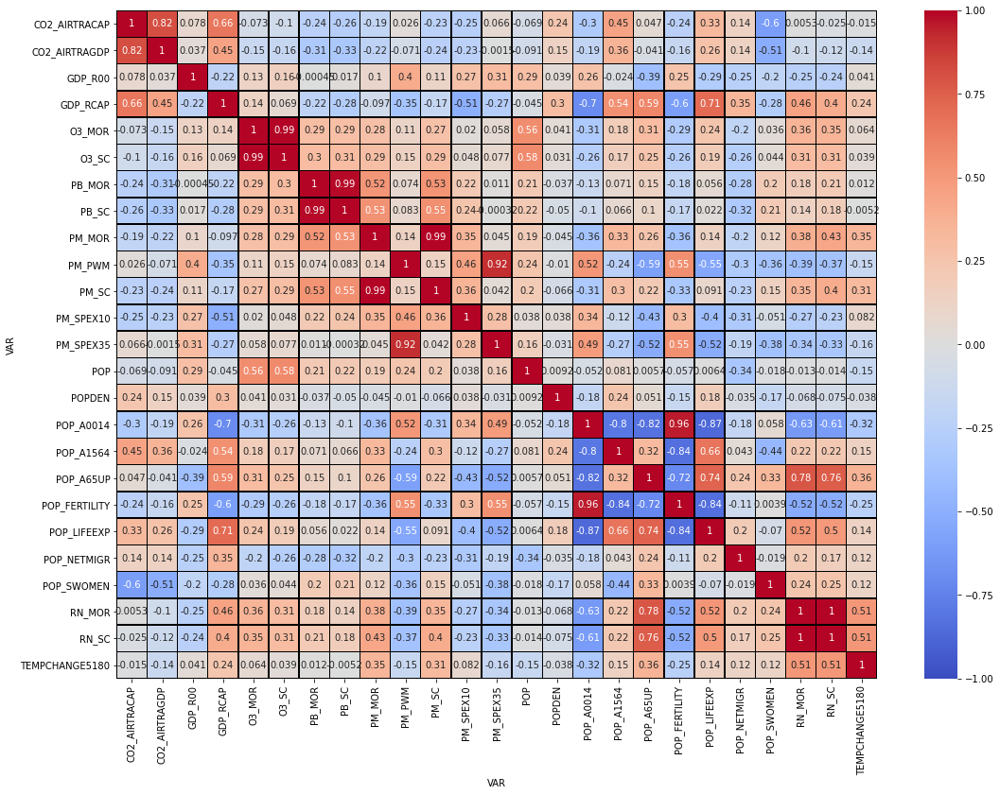

In [36]:
plt.figure(figsize=[18, 13])
sns.heatmap(df2019_pivoteado.corr(method='pearson'), annot=True, linewidths=.5, linecolor='black', cmap='coolwarm', center=0,
           vmin=-1, vmax=1)

#### Correlações fortes:
* CO2_AIRTRACAP x CO2_AIRTRAGDP 0,82
* O3_MOR x O3_SC 0,99
* PB_MOR x PB_SC 0,99
* PM_MOR x PM_SC 0,99
* PM_PWM x PM_SPEX35 0,92
* POP_A0014 x POP_FERTILITY 0,96
* RN_MOR x RN_SC 1,00

obs1: A primeira correlação é entre a emissão de CO2 em voos per capita(CO2_AIRTRACAP) e pelo pib(CO2_AIRTRAGDP). Optou-se pela exclusão da emissão per capita CO2_AIRTRACAP.

obs2: O que está como MOR é mortalidade devido à uma causa e o que está como SC é o custo dessa mortalidade ao sistema de saúde. Optou-se pela exclusão de SC.

obs3: O PWM refere-se a média de exposição da população à uma partícula e o SPEX35 a proporção da população que teve exposição superior ao limite indicado. Optou-se pela exclusão de SPEX35.

obs4: O POP_A0014 refere-se à taxa da população com idade inferior a 14 anos, a POP_FERTILITY refere-se a taxa de filhos por mulheres. Optou-se pela exclusão da POP_FERTILITY.

In [37]:
df2019_pivoteado.drop('CO2_AIRTRACAP', axis=1, inplace=True)

In [38]:
df2019_pivoteado.drop('O3_SC', axis=1, inplace=True)

In [39]:
df2019_pivoteado.drop('PB_SC', axis=1, inplace=True)

In [40]:
df2019_pivoteado.drop('PM_SC', axis=1, inplace=True)

In [41]:
df2019_pivoteado.drop('PM_SPEX35', axis=1, inplace=True)

In [42]:
df2019_pivoteado.drop('POP_FERTILITY', axis=1, inplace=True)

In [43]:
df2019_pivoteado.drop('RN_SC', axis=1, inplace=True)

In [44]:
df2019_pivoteado.shape

(176, 18)

<AxesSubplot:xlabel='VAR', ylabel='VAR'>

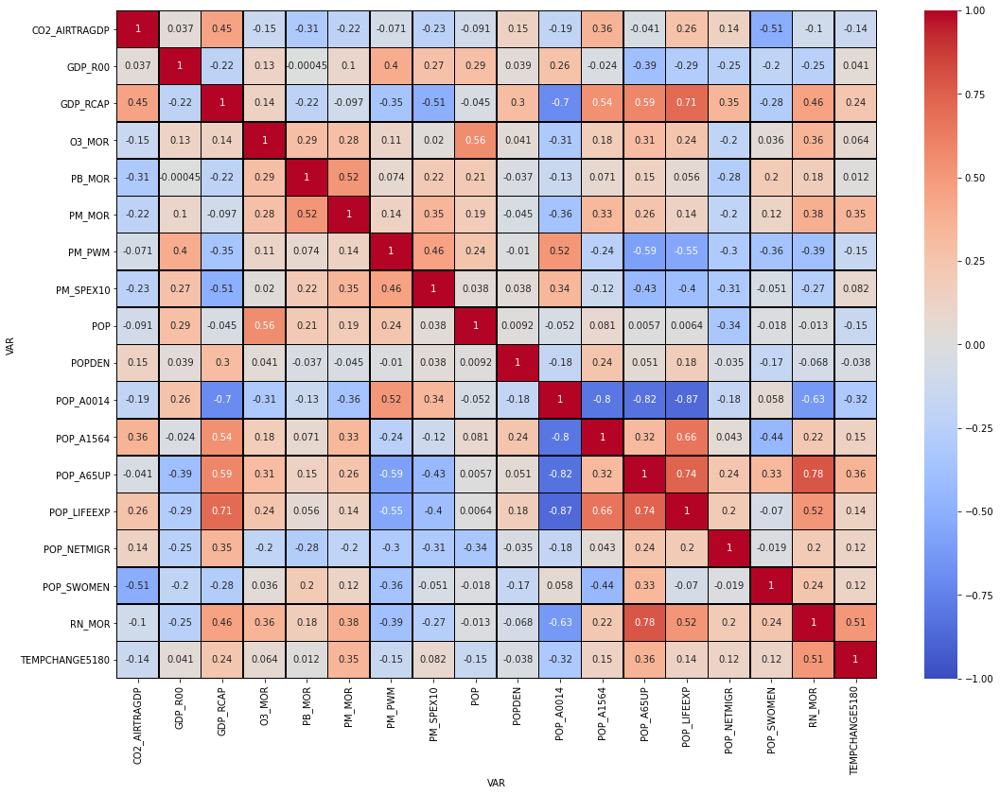

In [45]:
plt.figure(figsize=[18, 13])
sns.heatmap(df2019_pivoteado.corr(method='pearson'), annot=True, linewidths=.5, linecolor='black', cmap='coolwarm', center=0,
           vmin=-1, vmax=1)

* CO2_AIRTRAGDP 0 correlações críticas
* GDP_R00 0 correlações críticas
* GDP_RCAP 2 correlações críticas (-0,7 ; 0,71)
* O3_MOR 0 correlações críticas
* PB_MOR 0 correlações críticas
* PM_MOR 0 correlações críticas
* PM_PWM 0 correlações críticas
* PM_SPEX10 0 correlações críticas
* POP 0 correlações críticas
* POPDEN 0 correlações críticas
* POP_A0014 4 correlações críticas (-0,7 ; -0,8 ; -0,82 ; -0,87)
* POP_A1564 1 correlação crítica (-0,8)
* POP_A65UP 3 correlações críticas (-0,82 ; 0,74 ; 0,78)
* POP_LIFEEXP 3 correlações críticas (0,71 ; -0,87 ; 0,74)
* POP_NETMIGR 0 correlações críticas
* POP_SWOMEN0 correlações críticas
* RN_MOR 1 correlação crítica (0,78)
* TEMPCHANGE5180 0 correlações críticas

In [46]:
df2019_pivoteado.drop('POP_A0014', axis=1, inplace=True)

<AxesSubplot:xlabel='VAR', ylabel='VAR'>

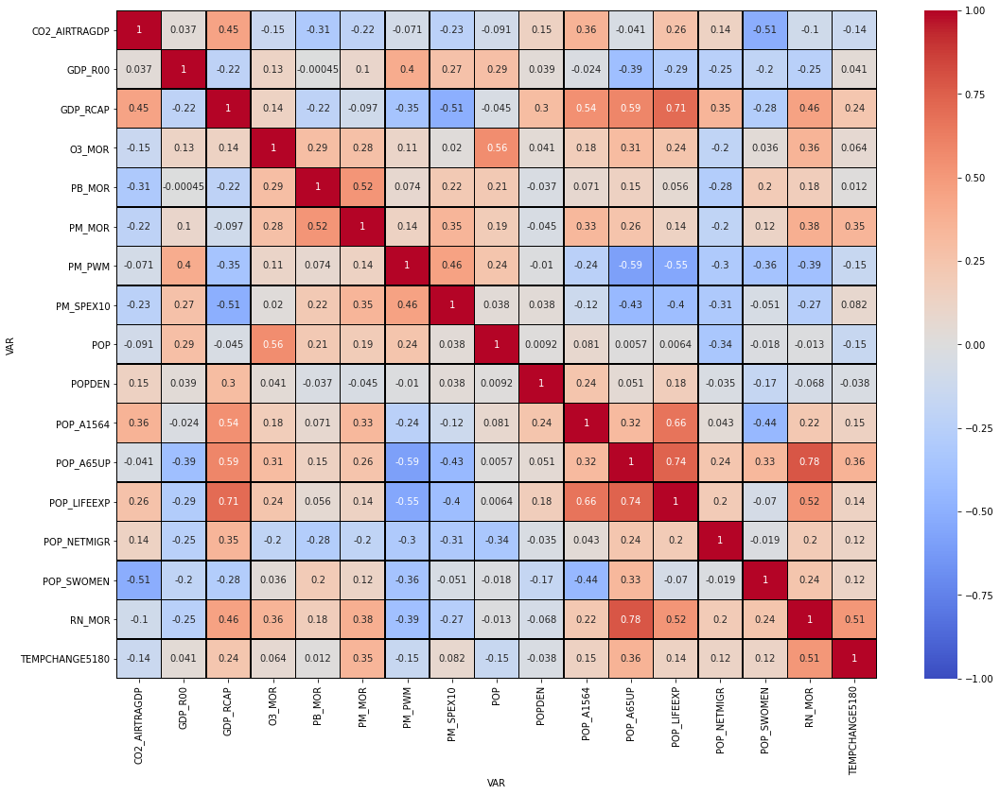

In [47]:
plt.figure(figsize=[18, 13])
sns.heatmap(df2019_pivoteado.corr(method='pearson'), annot=True, linewidths=.5, linecolor='black', cmap='coolwarm', center=0,
           vmin=-1, vmax=1)

* CO2_AIRTRAGDP 0 correlações críticas
* GDP_R00 0 correlações críticas
* GDP_RCAP 1 correlação crítica (0,71)
* O3_MOR 0 correlações críticas
* PB_MOR 0 correlações críticas
* PM_MOR 0 correlações críticas
* PM_PWM 0 correlações críticas
* PM_SPEX10 0 correlações críticas
* POP 0 correlações críticas
* POPDEN 0 correlações críticas
* POP_A1564 0 correlações críticas
* POP_A65UP 2 correlações críticas (0,74 ; 0,78)
* POP_LIFEEXP 2 correlações críticas (0,71 ; 0,74)
* POP_NETMIGR 0 correlações críticas
* POP_SWOMEN0 correlações críticas
* RN_MOR 1 correlação crítica (0,78)
* TEMPCHANGE5180 0 correlações críticas

In [48]:
df2019_pivoteado.drop('POP_A65UP', axis=1, inplace=True)

In [49]:
df2019_pivoteado.drop('POP_LIFEEXP', axis=1, inplace=True)

<AxesSubplot:xlabel='VAR', ylabel='VAR'>

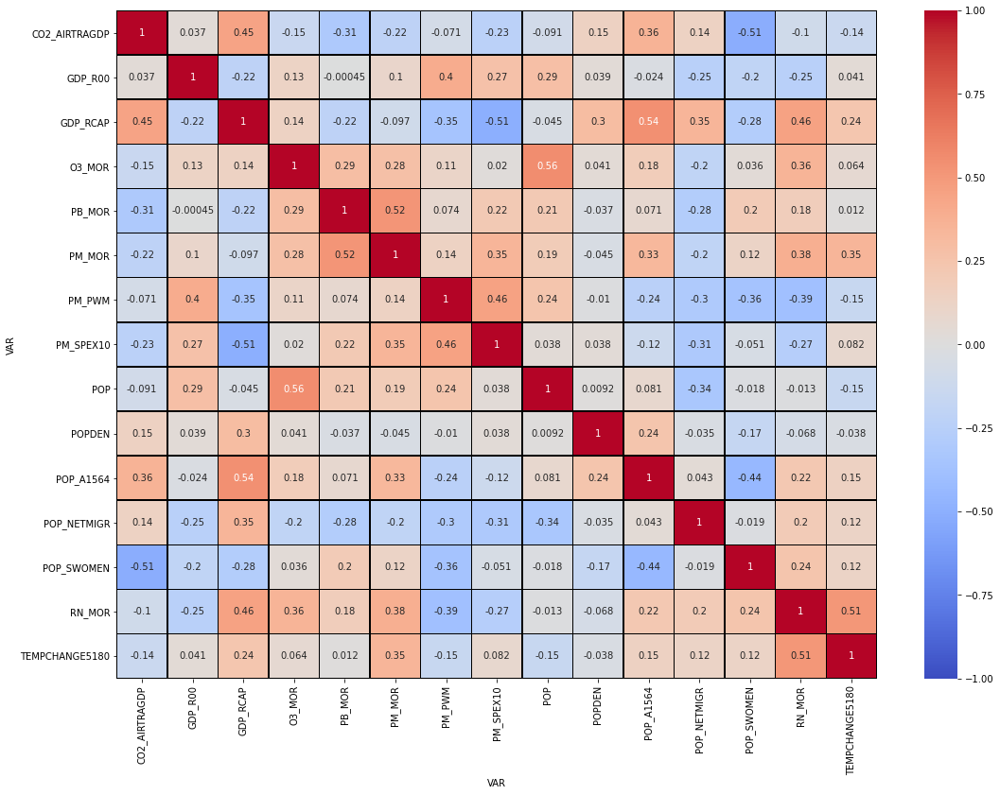

In [50]:
plt.figure(figsize=[18, 13])
sns.heatmap(df2019_pivoteado.corr(method='pearson'), annot=True, linewidths=.5, linecolor='black', cmap='coolwarm', center=0,
           vmin=-1, vmax=1)

In [51]:
df2019_pivoteado.shape

(176, 15)

<AxesSubplot:xlabel='VAR', ylabel='Country'>

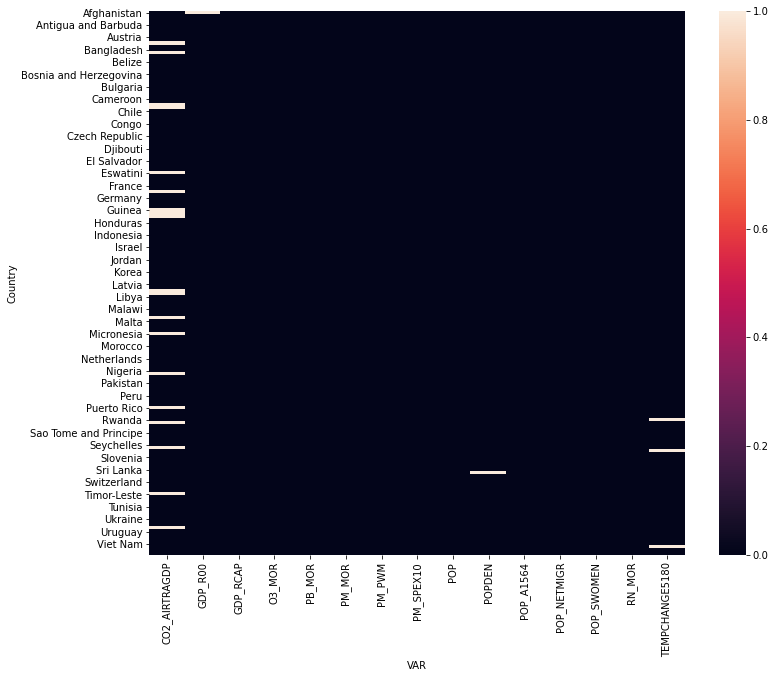

In [52]:
plt.figure(figsize=(12,10))
sns.heatmap(df2019_pivoteado.isna())

In [53]:
df2019_pivoteado.isna().sum()

VAR
CO2_AIRTRAGDP     19
GDP_R00            1
GDP_RCAP           0
O3_MOR             0
PB_MOR             0
PM_MOR             0
PM_PWM             0
PM_SPEX10          0
POP                0
POPDEN             1
POP_A1564          0
POP_NETMIGR        0
POP_SWOMEN         0
RN_MOR             0
TEMPCHANGE5180     3
dtype: int64

### Estimando o valor do atributo CO2_AIRTRAGDP para os EUA com regressão linear

In [54]:
lista_paises_dados_faltantes = df2019_pivoteado[df2019_pivoteado.CO2_AIRTRAGDP.isna()].index

In [55]:
lista_paises_dados_faltantes

Index(['Bahamas', 'Barbados', 'Central African Republic', 'Chad', 'Eswatini',
       'Gambia', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Lesotho', 'Liberia',
       'Mali', 'Micronesia', 'North Macedonia', 'Puerto Rico', 'Saint Lucia',
       'Sierra Leone', 'Timor-Leste', 'United States'],
      dtype='object', name='Country')

In [56]:
df

,COU,Country,VAR,Variable,YEA,Year,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
0,AUS,Australia,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",1990,1990,USD_KG,US dollars per kilogram,0,Units,2015,2015,1.964,NaN,NaN
1,AUS,Australia,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",1995,1995,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.095,NaN,NaN
2,AUS,Australia,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",2000,2000,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.161,NaN,NaN
3,AUS,Australia,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",2005,2005,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.340,NaN,NaN
4,AUS,Australia,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",2010,2010,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.560,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178450,COL,Colombia,NBAL_HA,Nitrogen balance per hectare,2014,2014,KG,Kilograms,0,Units,NaN,NaN,8.425,NaN,NaN
178451,COL,Colombia,NBAL_HA,Nitrogen balance per hectare,2015,2015,KG,Kilograms,0,Units,NaN,NaN,10.521,NaN,NaN
178452,COL,Colombia,NBAL_HA,Nitrogen balance per hectare,2016,2016,KG,Kilograms,0,Units,NaN,NaN,9.942,NaN,NaN
178453,COL,Colombia,NBAL_HA,Nitrogen balance per hectare,2017,2017,KG,Kilograms,0,Units,NaN,NaN,12.195,NaN,NaN


In [57]:
df_paises_na = df[df.Country.apply(lambda x: x in lista_paises_dados_faltantes)]

In [58]:
df_paises_na

,COU,Country,VAR,Variable,YEA,Year,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
10957,USA,United States,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",1990,1990,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.040,NaN,NaN
10958,USA,United States,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",1995,1995,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.192,NaN,NaN
10959,USA,United States,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",2000,2000,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.398,NaN,NaN
10960,USA,United States,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",2005,2005,USD_KG,US dollars per kilogram,0,Units,2015,2015,2.736,NaN,NaN
10961,USA,United States,CO2_PBPROD,"Production-based CO2 productivity, GDP per uni...",2010,2010,USD_KG,US dollars per kilogram,0,Units,2015,2015,3.049,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178277,LCA,Saint Lucia,O3_SC,Welfare costs of premature deaths from exposur...,2016,2016,PC,Percentage,0,Units,NaN,NaN,0.005,NaN,NaN
178278,LCA,Saint Lucia,O3_SC,Welfare costs of premature deaths from exposur...,2017,2017,PC,Percentage,0,Units,NaN,NaN,0.001,NaN,NaN
178279,LCA,Saint Lucia,O3_SC,Welfare costs of premature deaths from exposur...,2018,2018,PC,Percentage,0,Units,NaN,NaN,0.004,NaN,NaN
178280,LCA,Saint Lucia,O3_SC,Welfare costs of premature deaths from exposur...,2019,2019,PC,Percentage,0,Units,NaN,NaN,0.003,NaN,NaN


In [59]:
df_paises_na_pivot = pd.pivot_table(data=df_paises_na, values='Value', columns='VAR', index=['Country','Year'], aggfunc='sum')

In [60]:
df_paises_na_pivot

VAR                 AGRGDP_PC  ASEW_POP  ASEW_PWT  ASEW_SWT  ASEW_TWT  \
Country       Year                                                      
Bahamas       1990      2.551       nan       nan       nan       nan   
              1995      3.345       nan       nan       nan       nan   
              2000      1.475       nan       nan       nan       nan   
              2005      1.132       nan       nan       nan       nan   
              2010      1.172       nan       nan       nan       nan   
...                       ...       ...       ...       ...       ...   
United States 2016      0.970       nan       nan       nan       nan   
              2017      0.976       nan       nan       nan       nan   
              2018      0.897       nan       nan       nan       nan   
              2019        nan       nan       nan       nan       nan   
              2020        nan       nan       nan       nan       nan   

VAR                 BA_BUILTA  BA_BUILTA_CAP  BA_NEWBUILTA00  BA_NEWBUILTA90  \
Country       Year                                                             
Bahamas       1990      0.950        412.850             nan             nan   
              1995        nan            nan             nan             nan   
              2000      1.094        408.759             nan          15.168   
              2005        nan            nan             nan             nan   
              2010        nan            nan             nan             nan   
...                       ...            ...             ...             ...   
United States 2016        nan            nan             nan             nan   
              2017        nan            nan             nan             nan   
              2018        nan            nan             nan             nan   
              2019        nan            nan             nan             nan   
              2020        nan            nan             nan             nan   

VAR                 BIRD_FARM  ...  SW_SEASTOPERM  SW_SEASWAT  TEMPCHANGE5180  \
Country       Year             ...                                              
Bahamas       1990        nan  ...            nan         nan           0.857   
              1995        nan  ...            nan         nan           0.782   
              2000        nan  ...            nan         nan           0.307   
              2005        nan  ...            nan         nan           0.520   
              2010        nan  ...            nan         nan           0.336   
...                       ...  ...            ...         ...             ...   
United States 2016        nan  ...            nan         nan           2.197   
              2017        nan  ...            nan         nan           1.408   
              2018        nan  ...            nan         nan           1.244   
              2019        nan  ...            nan         nan           1.011   
              2020        nan  ...            nan         nan             nan   

VAR                 WATER_FWCAP  WATER_FW_TIRR  WATER_FW_TR  WATER_STPC  \
Country       Year                                                        
Bahamas       1990          nan            nan          nan         nan   
              1995          nan            nan          nan         nan   
              2000          nan            nan          nan         nan   
              2005          nan            nan          nan         nan   
              2010          nan            nan          nan         nan   
...                         ...            ...          ...         ...   
United States 2016          nan            nan          nan         nan   
              2017          nan            nan          nan         nan   
              2018          nan            nan          nan         nan   
              2019          nan            nan          nan         nan   
              2020          nan            nan         

In [61]:
matriz_pais_ano = df_paises_na_pivot['CO2_AIRTRAGDP'].unstack()

In [62]:
matriz_pais_ano

Year,1990,1995,2000,2005,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Country,,,,,,,,,,,,,,,
Bahamas,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Barbados,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Central African Republic,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.311,0.425,nan,nan
Chad,nan,nan,nan,nan,nan,nan,nan,0.626,2.706,nan,nan,nan,nan,nan,nan
Eswatini,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Gambia,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Guinea,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Guinea-Bissau,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Guyana,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [63]:
from sklearn.linear_model import LinearRegression

In [64]:
regressao = LinearRegression()

In [65]:
matriz_pais_ano.loc['United States',2013:2018].values

array([10.14441 ,  9.767545,  9.922998, 10.38942 , 10.16822 , 10.06479 ])

In [66]:
regressao.fit(X=np.array(matriz_pais_ano.loc['United States',2013:2018].index).reshape((-1,1)),
              y=matriz_pais_ano.loc['United States',2013:2018].values)

LinearRegression()

In [67]:
regressao.predict(np.array([2019]).reshape((-1,1)))[0]

10.203265199999997

In [68]:
df2019_pivoteado.loc['United States','CO2_AIRTRAGDP']=regressao.predict(np.array([2019]).reshape((-1,1)))[0]

In [69]:
df2019_pivoteado.loc['United States']

VAR
CO2_AIRTRAGDP        10.203
GDP_R00             145.394
GDP_RCAP          60700.890
O3_MOR               38.862
PB_MOR               63.226
PM_MOR              145.260
PM_PWM                7.676
PM_SPEX10             5.613
POP              329064.906
POPDEN               35.974
POP_A1564            65.219
POP_NETMIGR        4709.329
POP_SWOMEN           50.518
RN_MOR               27.599
TEMPCHANGE5180        1.011
Name: United States, dtype: float64

### Excluindo todas as instâncias que ainda tiverem dados faltantes

In [70]:
df2019_pivoteado.dropna(axis=0, inplace=True)

<AxesSubplot:xlabel='VAR', ylabel='Country'>

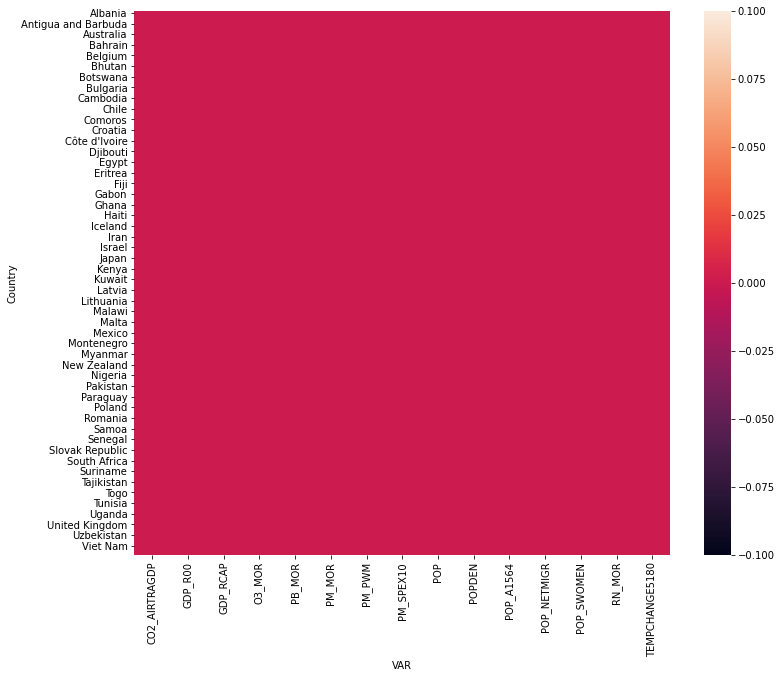

In [71]:
plt.figure(figsize=(12,10))
sns.heatmap(df2019_pivoteado.dropna(axis=0).isna())

In [74]:
df2019_pivoteado.shape

(153, 15)

### Indicadores utilizados nas tarefas de agrupamento 
#### Indicador -      	Eixo conceitual
* Emissões de CO2 de transporte aéreo por unidade do PIB -    	Produtividade ambiental e de recursos
* Mudança da temperatura anual da superfície, desde 1951-1980 -   	Base de ativos naturais
* Mortalidade por exposição ao ozônio -   	Dimensão ambiental da qualidade de vida
* Mortalidade por exposição ao chumbo -   	Dimensão ambiental da qualidade de vida
* Mortalidade por exposição a PM2.5 -     	Dimensão ambiental da qualidade de vida
* Exposição média da população a PM2.5 -      	Dimensão ambiental da qualidade de vida
* Porcentagem da população exposta a mais de 10 µg / m³ -      	Dimensão ambiental da qualidade de vida
* Mortalidade por exposição ao radônio residencial -      	Dimensão ambiental da qualidade de vida
* PIB real, índice 2000 = 100 -      	Contexto socioeconômico
* PIB real per capita -      	Contexto socioeconômico
* População -      	Contexto socioeconômico
* Densidade populacional, habitantes por km² -      	Contexto socioeconômico
* População por faixa etária 15 a 64 anos, % do total -      	Contexto socioeconômico
* Rede de migração -      	Contexto socioeconômico
* Mulheres, % da população total -      	Contexto socioeconômico



### Exportando a base de dados pré processadas como .csv

In [75]:
df2019_pivoteado.to_csv('GREEN_GROWTH_2019_preprocessamento.csv')

In [76]:
df2019_pivoteado_teste = pd.read_csv('GREEN_GROWTH_2019_preprocessamento.csv')

In [77]:
df2019_pivoteado_teste

,Country,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
0,Albania,1.150,214.599,13311.800,8.324,175.375,532.035,18.460,99.988,2880.913,105.143,68.189,-69.998,49.086,44.755,1.911
1,Algeria,2.430,183.638,11847.530,14.315,90.620,502.327,32.916,99.886,43053.055,18.076,63.019,-50.002,49.482,2.528,1.224
2,Angola,3.212,274.372,6075.285,4.721,38.282,174.547,28.022,99.993,31825.299,25.528,51.274,19.240,50.527,2.092,1.694
3,Antigua and Barbuda,23.983,152.160,22282.910,0.010,61.534,309.069,17.620,100.000,97.115,220.716,68.904,0.000,51.757,2.583,0.827
4,Argentina,3.574,129.807,18495.530,11.843,37.706,281.206,13.847,98.525,44780.676,16.363,64.172,22.000,51.226,8.417,0.709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Vanuatu,65.760,164.020,3051.619,2.055,42.433,181.466,12.741,93.745,299.882,24.601,57.842,0.360,49.301,4.746,1.056
149,Venezuela,2.755,49.986,6607.628,5.963,114.658,430.519,22.215,99.749,28515.828,32.329,64.867,-1309.495,50.746,9.444,1.194
150,Viet Nam,8.754,328.487,7621.996,13.680,76.157,388.530,20.195,92.366,96462.109,311.098,69.204,-425.631,50.083,5.384,1.841
151,Zambia,1.023,283.681,3441.110,5.555,34.864,164.885,25.924,100.000,17861.033,24.026,53.479,-40.000,50.489,1.508,1.456


### Analisando os outliers

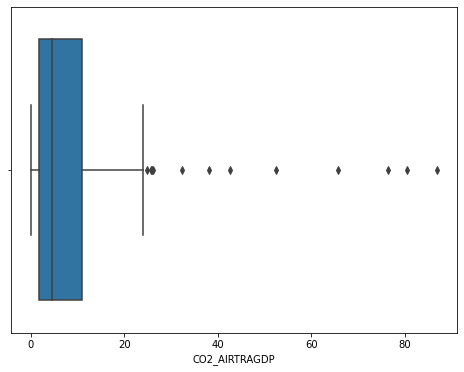

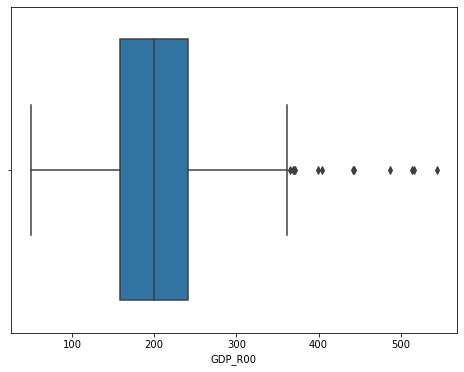

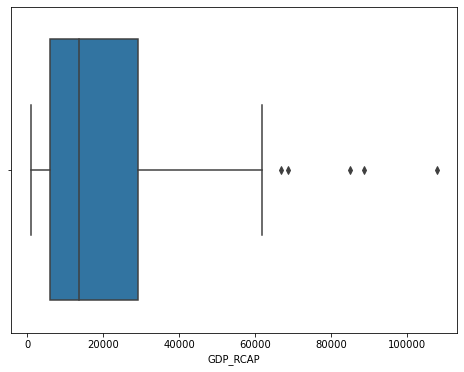

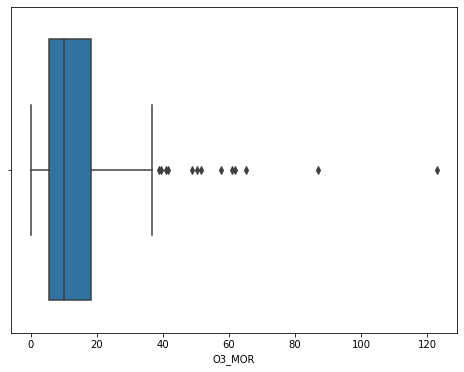

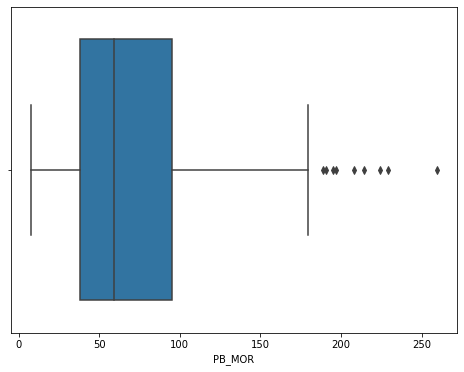

...

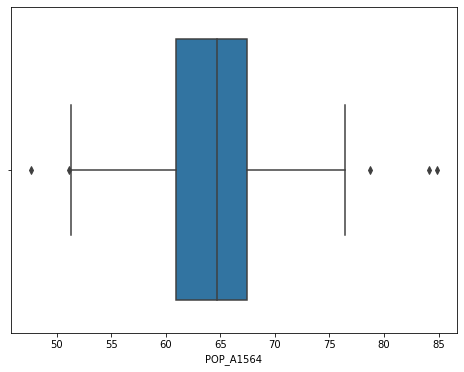

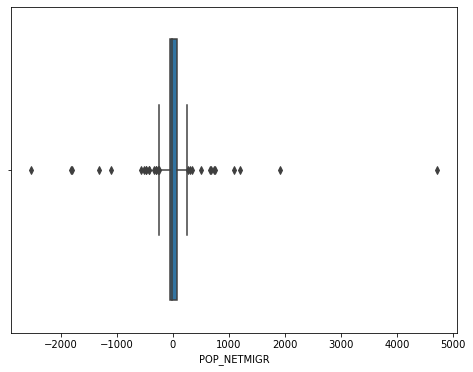

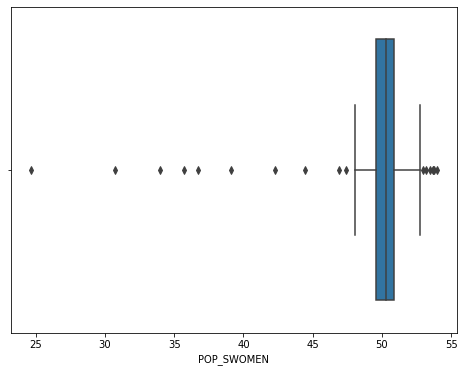

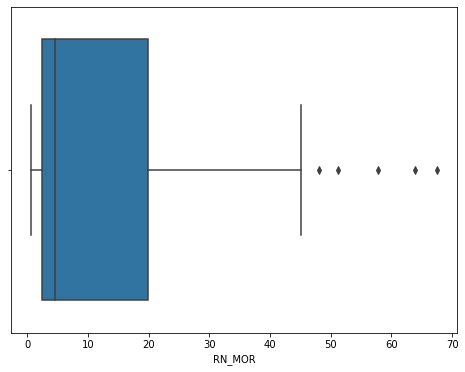

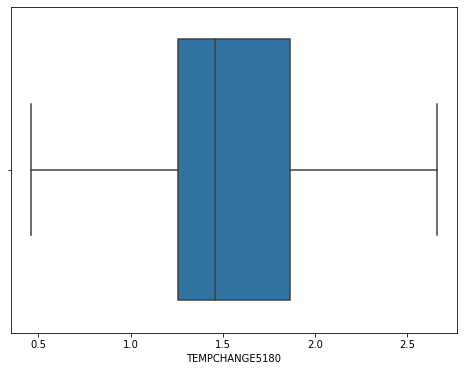

In [78]:
for i in df2019_pivoteado.columns:
    plt.figure(figsize=[8, 6])
    sns.boxplot(data=df2019_pivoteado, x=i)

#### O alto número de outliers nos dados indica que padronização por StandardScaler pode ser uma opção melhor que a normalização por MinMax.
#### Além disso o DBScan provavelmente não é um bom método de agrupamento para esse conjunto.

### Padronizando os dados

In [79]:
from sklearn.preprocessing import StandardScaler

In [80]:
scaler = StandardScaler().fit(df2019_pivoteado)

In [81]:
df_scaler = scaler.transform(df2019_pivoteado)

### K-means

In [82]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score

In [83]:
kmeans_silhueta = []
for i in [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]:
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(df_scaler)
    kmeans_silhueta.append(silhouette_score(df_scaler, kmeans.labels_))
    print(f'Coeficiente da silhueta com {i} clusters para k-means = {silhouette_score(df_scaler, kmeans.labels_):.3f}')

Coeficiente da silhueta com 2 clusters para k-means = 0.248
Coeficiente da silhueta com 3 clusters para k-means = 0.239
Coeficiente da silhueta com 4 clusters para k-means = 0.232
Coeficiente da silhueta com 5 clusters para k-means = 0.264
Coeficiente da silhueta com 6 clusters para k-means = 0.187
Coeficiente da silhueta com 7 clusters para k-means = 0.174
Coeficiente da silhueta com 8 clusters para k-means = 0.176
Coeficiente da silhueta com 9 clusters para k-means = 0.185
Coeficiente da silhueta com 10 clusters para k-means = 0.187
Coeficiente da silhueta com 11 clusters para k-means = 0.197
Coeficiente da silhueta com 12 clusters para k-means = 0.203
Coeficiente da silhueta com 13 clusters para k-means = 0.185
Coeficiente da silhueta com 14 clusters para k-means = 0.210
Coeficiente da silhueta com 15 clusters para k-means = 0.164
Coeficiente da silhueta com 16 clusters para k-means = 0.177
Coeficiente da silhueta com 17 clusters para k-means = 0.180
Coeficiente da silhueta com 18 c

### Agrupamento hierárquico

In [84]:
hierarquico_silhueta = []
for i in [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]:
    hierarquico = AgglomerativeClustering(n_clusters=i, linkage="ward")
    hierarquico.fit(df_scaler)
    hierarquico_silhueta.append(silhouette_score(df_scaler, hierarquico.labels_))
    print(f'Coeficiente da silhueta com {i} clusters para agrupamento hirárquico = {silhouette_score(df_scaler, hierarquico.labels_):.3f}')

Coeficiente da silhueta com 2 clusters para agrupamento hirárquico = 0.208
Coeficiente da silhueta com 3 clusters para agrupamento hirárquico = 0.228
Coeficiente da silhueta com 4 clusters para agrupamento hirárquico = 0.250
Coeficiente da silhueta com 5 clusters para agrupamento hirárquico = 0.261
Coeficiente da silhueta com 6 clusters para agrupamento hirárquico = 0.157
Coeficiente da silhueta com 7 clusters para agrupamento hirárquico = 0.151
Coeficiente da silhueta com 8 clusters para agrupamento hirárquico = 0.159
Coeficiente da silhueta com 9 clusters para agrupamento hirárquico = 0.167
Coeficiente da silhueta com 10 clusters para agrupamento hirárquico = 0.172
Coeficiente da silhueta com 11 clusters para agrupamento hirárquico = 0.185
Coeficiente da silhueta com 12 clusters para agrupamento hirárquico = 0.192
Coeficiente da silhueta com 13 clusters para agrupamento hirárquico = 0.193
Coeficiente da silhueta com 14 clusters para agrupamento hirárquico = 0.197
Coeficiente da silhu

### Comparação entre os métodos e número de clusters para os dados padronizados através dos coeficientes de silhueta

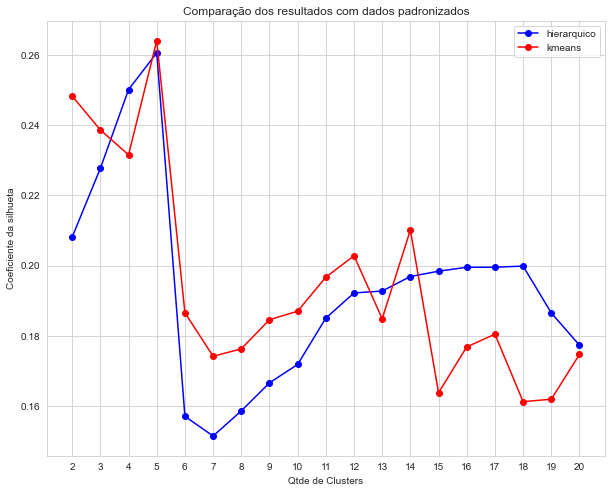

In [85]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,8))
plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],hierarquico_silhueta, marker='o', color='blue')
plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],kmeans_silhueta, marker='o', color='red')
plt.xticks(range(2,21,1))
plt.xlabel('Qtde de Clusters')
plt.ylabel('Coeficiente da silhueta')
plt.title('Comparação dos resultados com dados padronizados')
plt.legend(['hierarquico','kmeans'])

### Construção do dendrograma do agrupamento hierárquico

In [86]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [87]:
link = linkage(df_scaler, method="ward")

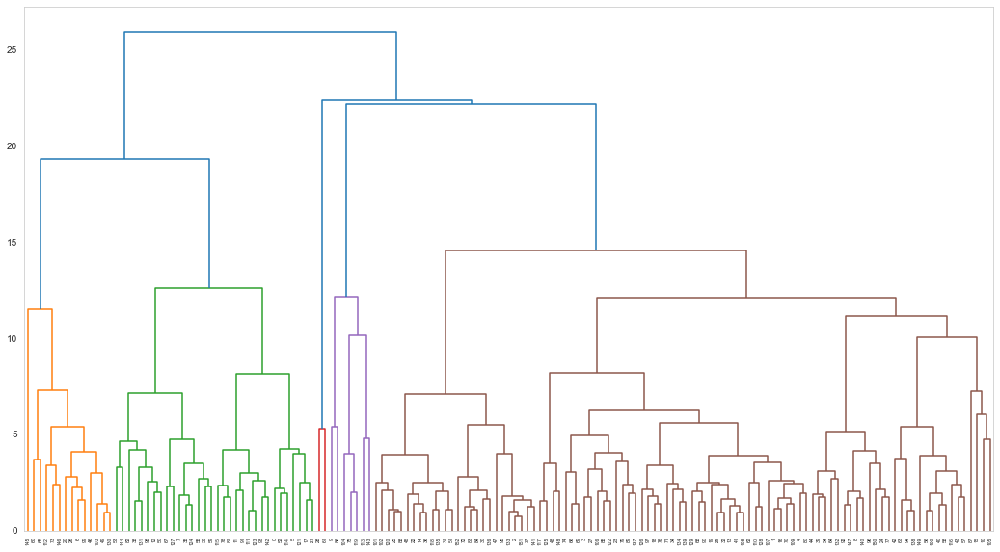

In [88]:
plt.rcParams["axes.grid"] = False
plt.figure(figsize=(18,10))
dendrogram(link)
plt.show()

### Plotando os clusters de paises no mapa mundi

In [89]:
kmeans5 = KMeans(n_clusters=5, random_state=42)
kmeans5.fit(df_scaler)

KMeans(n_clusters=5, random_state=42)

In [90]:
hierarquico5 = AgglomerativeClustering(n_clusters=5, linkage="ward")
hierarquico5.fit(df_scaler)

AgglomerativeClustering(n_clusters=5)

In [91]:
df_COU = pd.read_csv('GREEN_GROWTH_2019.csv')

In [92]:
df_siglas = df_COU[['Country','COU']].drop_duplicates()

In [93]:
df_kmeans = pd.merge(df2019_pivoteado, df_siglas, left_on=df2019_pivoteado.index, right_on=df_siglas.Country, how='left')

In [94]:
df_kmeans['Cluster']=kmeans5.labels_

In [95]:
df_kmeans

,key_0,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180,Country,COU,Cluster
0,Albania,1.150,214.599,13311.800,8.324,175.375,532.035,18.460,99.988,2880.913,105.143,68.189,-69.998,49.086,44.755,1.911,Albania,ALB,1
1,Algeria,2.430,183.638,11847.530,14.315,90.620,502.327,32.916,99.886,43053.055,18.076,63.019,-50.002,49.482,2.528,1.224,Algeria,DZA,3
2,Angola,3.212,274.372,6075.285,4.721,38.282,174.547,28.022,99.993,31825.299,25.528,51.274,19.240,50.527,2.092,1.694,Angola,AGO,3
3,Antigua and Barbuda,23.983,152.160,22282.910,0.010,61.534,309.069,17.620,100.000,97.115,220.716,68.904,0.000,51.757,2.583,0.827,Antigua and Barbuda,ATG,3
4,Argentina,3.574,129.807,18495.530,11.843,37.706,281.206,13.847,98.525,44780.676,16.363,64.172,22.000,51.226,8.417,0.709,Argentina,ARG,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Vanuatu,65.760,164.020,3051.619,2.055,42.433,181.466,12.741,93.745,299.882,24.601,57.842,0.360,49.301,4.746,1.056,Vanuatu,VUT,3
149,Venezuela,2.755,49.986,6607.628,5.963,114.658,430.519,22.215,99.749,28515.828,32.329,64.867,-1309.495,50.746,9.444,1.194,Venezuela,VEN,3
150,Viet Nam,8.754,328.487,7621.996,13.680,76.157,388.530,20.195,92.366,96462.109,311.098,69.204,-425.631,50.083,5.384,1.841,Viet Nam,VNM,3
151,Zambia,1.023,283.681,3441.110,5.555,34.864,164.885,25.924,100.000,17861.033,24.026,53.479,-40.000,50.489,1.508,1.456,Zambia,ZMB,3


In [96]:
df_kmeans.drop('key_0', axis=1, inplace=True)

In [97]:
df_kmeans.columns

Index(['CO2_AIRTRAGDP', 'GDP_R00', 'GDP_RCAP', 'O3_MOR', 'PB_MOR', 'PM_MOR',
       'PM_PWM', 'PM_SPEX10', 'POP', 'POPDEN', 'POP_A1564', 'POP_NETMIGR',
       'POP_SWOMEN', 'RN_MOR', 'TEMPCHANGE5180', 'Country', 'COU', 'Cluster'],
      dtype='object')

In [98]:
df_kmeans = df_kmeans[['Country', 'COU', 'Cluster','CO2_AIRTRAGDP', 'GDP_R00', 'GDP_RCAP', 
                       'O3_MOR', 'PB_MOR', 'PM_MOR','PM_PWM', 'PM_SPEX10', 'POP', 'POPDEN', 
                       'POP_A1564', 'POP_NETMIGR', 'POP_SWOMEN', 'RN_MOR', 'TEMPCHANGE5180']]

In [99]:
df_kmeans

,Country,COU,Cluster,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
0,Albania,ALB,1,1.150,214.599,13311.800,8.324,175.375,532.035,18.460,99.988,2880.913,105.143,68.189,-69.998,49.086,44.755,1.911
1,Algeria,DZA,3,2.430,183.638,11847.530,14.315,90.620,502.327,32.916,99.886,43053.055,18.076,63.019,-50.002,49.482,2.528,1.224
2,Angola,AGO,3,3.212,274.372,6075.285,4.721,38.282,174.547,28.022,99.993,31825.299,25.528,51.274,19.240,50.527,2.092,1.694
3,Antigua and Barbuda,ATG,3,23.983,152.160,22282.910,0.010,61.534,309.069,17.620,100.000,97.115,220.716,68.904,0.000,51.757,2.583,0.827
4,Argentina,ARG,3,3.574,129.807,18495.530,11.843,37.706,281.206,13.847,98.525,44780.676,16.363,64.172,22.000,51.226,8.417,0.709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Vanuatu,VUT,3,65.760,164.020,3051.619,2.055,42.433,181.466,12.741,93.745,299.882,24.601,57.842,0.360,49.301,4.746,1.056
149,Venezuela,VEN,3,2.755,49.986,6607.628,5.963,114.658,430.519,22.215,99.749,28515.828,32.329,64.867,-1309.495,50.746,9.444,1.194
150,Viet Nam,VNM,3,8.754,328.487,7621.996,13.680,76.157,388.530,20.195,92.366,96462.109,311.098,69.204,-425.631,50.083,5.384,1.841
151,Zambia,ZMB,3,1.023,283.681,3441.110,5.555,34.864,164.885,25.924,100.000,17861.033,24.026,53.479,-40.000,50.489,1.508,1.456


In [100]:
!pip install plotly.express

In [101]:
import plotly.express as px
import json
m = open('world_map.json')
world = json.load(m)

In [102]:
world

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'scalerank': 1,
    'featurecla': 'Admin-0 country',
    'labelrank': 4,
    'sovereignt': 'The Bahamas',
    'sov_a3': 'BHS',
    'adm0_dif': 0,
    'level': 2,
    'type': 'Sovereign country',
    'admin': 'The Bahamas',
    'adm0_a3': 'BHS',
    'geou_dif': 0,
    'geounit': 'The Bahamas',
    'gu_a3': 'BHS',
    'su_dif': 0,
    'subunit': 'The Bahamas',
    'su_a3': 'BHS',
    'brk_diff': 0,
    'name': 'Bahamas',
    'name_long': 'Bahamas',
    'brk_a3': 'BHS',
    'brk_name': 'Bahamas',
    'brk_group': None,
    'abbrev': 'Bhs.',
    'postal': 'BS',
    'formal_en': 'Commonwealth of the Bahamas',
    'formal_fr': None,
    'note_adm0': None,
    'note_brk': None,
    'name_sort': 'Bahamas, The',
    'name_alt': None,
    'mapcolor7': 1,
    'mapcolor8': 1,
    'mapcolor9': 2,
    'mapcolor13': 5,
    'pop_est': 309156,
    'gdp_md_est': 9093,
    'pop_year': -99,
    'lastcensus': 2010,
    'gdp_y

### Clusters do método k-means no mapa-mundi

In [103]:
fig = px.choropleth(
    df_kmeans,
    locations = "COU", #database
    geojson = world, #define the limits on the map/geography
    #range_color=(0, 1),
    color = "Cluster", #defining the color of the scale through the database
    hover_name = "Country", #the information in the box
    hover_data =["Cluster"],
    color_continuous_scale='plasma',
    featureidkey='properties.adm0_a3')
fig.show()

In [104]:
df_hierarquico = pd.merge(df2019_pivoteado, df_siglas, left_on=df2019_pivoteado.index, right_on=df_siglas.Country, how='left')

In [105]:
df_hierarquico['Cluster']=hierarquico5.labels_
df_hierarquico

,key_0,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180,Country,COU,Cluster
0,Albania,1.150,214.599,13311.800,8.324,175.375,532.035,18.460,99.988,2880.913,105.143,68.189,-69.998,49.086,44.755,1.911,Albania,ALB,1
1,Algeria,2.430,183.638,11847.530,14.315,90.620,502.327,32.916,99.886,43053.055,18.076,63.019,-50.002,49.482,2.528,1.224,Algeria,DZA,0
2,Angola,3.212,274.372,6075.285,4.721,38.282,174.547,28.022,99.993,31825.299,25.528,51.274,19.240,50.527,2.092,1.694,Angola,AGO,0
3,Antigua and Barbuda,23.983,152.160,22282.910,0.010,61.534,309.069,17.620,100.000,97.115,220.716,68.904,0.000,51.757,2.583,0.827,Antigua and Barbuda,ATG,0
4,Argentina,3.574,129.807,18495.530,11.843,37.706,281.206,13.847,98.525,44780.676,16.363,64.172,22.000,51.226,8.417,0.709,Argentina,ARG,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Vanuatu,65.760,164.020,3051.619,2.055,42.433,181.466,12.741,93.745,299.882,24.601,57.842,0.360,49.301,4.746,1.056,Vanuatu,VUT,0
149,Venezuela,2.755,49.986,6607.628,5.963,114.658,430.519,22.215,99.749,28515.828,32.329,64.867,-1309.495,50.746,9.444,1.194,Venezuela,VEN,0
150,Viet Nam,8.754,328.487,7621.996,13.680,76.157,388.530,20.195,92.366,96462.109,311.098,69.204,-425.631,50.083,5.384,1.841,Viet Nam,VNM,0
151,Zambia,1.023,283.681,3441.110,5.555,34.864,164.885,25.924,100.000,17861.033,24.026,53.479,-40.000,50.489,1.508,1.456,Zambia,ZMB,0


In [106]:
df_hierarquico.drop('key_0', axis=1, inplace=True)

In [107]:
df_hierarquico.columns

Index(['CO2_AIRTRAGDP', 'GDP_R00', 'GDP_RCAP', 'O3_MOR', 'PB_MOR', 'PM_MOR',
       'PM_PWM', 'PM_SPEX10', 'POP', 'POPDEN', 'POP_A1564', 'POP_NETMIGR',
       'POP_SWOMEN', 'RN_MOR', 'TEMPCHANGE5180', 'Country', 'COU', 'Cluster'],
      dtype='object')

In [108]:
df_hierarquico = df_hierarquico[['Country', 'COU', 'Cluster','CO2_AIRTRAGDP', 'GDP_R00', 'GDP_RCAP', 
                                 'O3_MOR', 'PB_MOR', 'PM_MOR','PM_PWM', 'PM_SPEX10', 'POP', 'POPDEN', 
                                 'POP_A1564', 'POP_NETMIGR', 'POP_SWOMEN', 'RN_MOR', 'TEMPCHANGE5180']]

In [109]:
df_hierarquico

,Country,COU,Cluster,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
0,Albania,ALB,1,1.150,214.599,13311.800,8.324,175.375,532.035,18.460,99.988,2880.913,105.143,68.189,-69.998,49.086,44.755,1.911
1,Algeria,DZA,0,2.430,183.638,11847.530,14.315,90.620,502.327,32.916,99.886,43053.055,18.076,63.019,-50.002,49.482,2.528,1.224
2,Angola,AGO,0,3.212,274.372,6075.285,4.721,38.282,174.547,28.022,99.993,31825.299,25.528,51.274,19.240,50.527,2.092,1.694
3,Antigua and Barbuda,ATG,0,23.983,152.160,22282.910,0.010,61.534,309.069,17.620,100.000,97.115,220.716,68.904,0.000,51.757,2.583,0.827
4,Argentina,ARG,0,3.574,129.807,18495.530,11.843,37.706,281.206,13.847,98.525,44780.676,16.363,64.172,22.000,51.226,8.417,0.709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Vanuatu,VUT,0,65.760,164.020,3051.619,2.055,42.433,181.466,12.741,93.745,299.882,24.601,57.842,0.360,49.301,4.746,1.056
149,Venezuela,VEN,0,2.755,49.986,6607.628,5.963,114.658,430.519,22.215,99.749,28515.828,32.329,64.867,-1309.495,50.746,9.444,1.194
150,Viet Nam,VNM,0,8.754,328.487,7621.996,13.680,76.157,388.530,20.195,92.366,96462.109,311.098,69.204,-425.631,50.083,5.384,1.841
151,Zambia,ZMB,0,1.023,283.681,3441.110,5.555,34.864,164.885,25.924,100.000,17861.033,24.026,53.479,-40.000,50.489,1.508,1.456


### Clusters do método agrupamento hirárquico no mapa-mundi

In [110]:
fig = px.choropleth(
    df_hierarquico,
    locations = "COU", #database
    geojson = world, #define the limits on the map/geography
    #range_color=(0, 1),
    color = "Cluster", #defining the color of the scale through the database
    hover_name = "Country", #the information in the box
    hover_data =["Cluster"],
    color_continuous_scale="plasma",
    featureidkey='properties.adm0_a3')
fig.show()

### Análise dos resultados

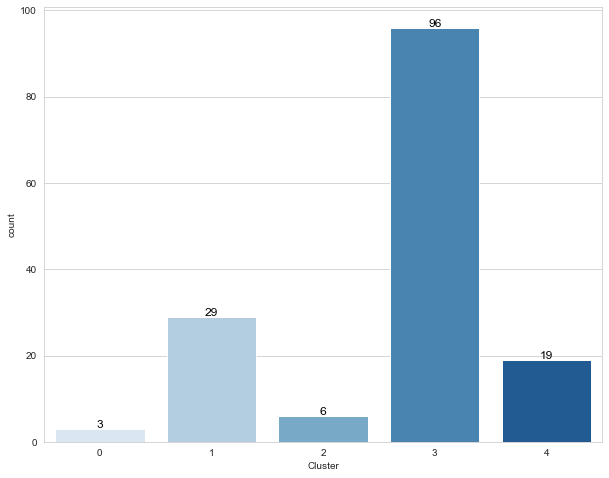

In [121]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,8))
plot_df = sns.countplot(data=df_kmeans, x='Cluster', palette='Blues')
for i in plot_df.patches:
    plot_df.annotate(i.get_height(),
                 (i.get_x() + i.get_width() / 2, i.get_height()),
                  ha='center', va='baseline', fontsize=12,
                  color='black', xytext=(0, 1),
                  textcoords='offset points')

In [113]:
df_kmeans[df_kmeans.Cluster==0].describe()

,Cluster,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
count,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000
mean,0.000,2.798,395.993,9052.766,83.008,185.324,721.529,64.859,99.960,987749.224,621.424,68.447,-2039.524,48.713,8.323,1.106
std,0.000,1.758,104.331,6094.199,34.674,13.708,269.901,17.824,0.051,715007.614,567.788,2.031,421.578,0.694,10.064,0.380
min,0.000,1.420,313.332,4567.944,60.954,170.210,453.833,47.729,99.902,163046.172,152.130,67.012,-2526.222,48.030,2.127,0.685
25%,0.000,1.807,337.379,5583.474,63.025,179.510,585.503,55.637,99.945,764731.961,305.855,67.285,-2165.423,48.362,2.516,0.948
50%,0.000,2.195,361.427,6599.003,65.096,188.810,717.172,63.545,99.988,1366417.750,459.580,67.558,-1804.623,48.693,2.906,1.211
75%,0.000,3.487,437.324,11295.177,94.035,192.882,855.377,73.425,99.989,1400100.750,856.071,69.164,-1796.175,49.055,11.420,1.317
max,0.000,4.778,513.221,15991.350,122.975,196.953,993.582,83.304,99.990,1433783.750,1252.563,70.770,-1787.726,49.417,19.935,1.423


In [114]:
df_kmeans[df_kmeans.Cluster==1].describe()

,Cluster,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
count,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000,29.000
mean,1.000,5.067,192.892,28794.260,23.658,109.095,655.679,17.939,94.079,20024.222,177.945,66.299,112.544,51.469,34.391,2.130
std,0.000,5.057,68.227,13720.934,14.489,61.006,285.033,6.023,11.565,31580.333,263.272,2.300,403.086,1.326,15.068,0.388
min,1.000,0.011,101.046,7652.656,5.934,36.396,267.220,10.469,52.181,440.377,8.907,63.405,-251.998,49.086,6.331,1.112
25%,1.000,1.678,151.605,14450.600,10.672,59.038,426.671,13.065,96.299,3300.998,64.482,64.594,-50.000,50.555,24.672,1.913
50%,1.000,2.760,189.298,28790.290,24.874,93.720,586.188,16.596,99.384,8955.108,103.889,65.839,3.601,51.319,34.709,2.143
75%,1.000,6.815,212.872,38093.120,30.480,129.596,783.148,19.927,99.988,17097.123,123.739,67.626,75.194,52.318,44.508,2.375
max,1.000,23.068,441.441,54551.910,57.654,259.446,1296.192,34.241,100.000,145872.266,1376.178,72.131,1920.468,53.956,67.485,2.662


In [115]:
df_kmeans[df_kmeans.Cluster==2].describe()

,Cluster,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
count,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000
mean,2.000,37.987,258.801,47988.657,10.004,23.102,279.617,49.443,86.254,3992.798,751.688,79.162,157.289,33.483,1.584,1.524
std,0.000,34.269,116.420,25689.693,6.411,11.398,113.464,22.713,33.129,3263.574,927.891,4.291,93.072,5.142,0.644,0.625
min,2.000,10.967,180.796,18351.020,3.276,7.589,92.749,10.892,18.633,530.957,16.074,75.155,16.818,24.666,0.890,0.803
25%,2.000,14.346,190.904,32206.893,4.942,14.497,222.140,43.372,99.406,1938.891,162.203,75.905,133.207,31.552,1.167,1.004
50%,2.000,20.520,214.561,42760.035,8.860,25.575,323.731,51.449,99.825,3519.574,241.284,77.578,159.280,34.855,1.378,1.540
75%,2.000,62.666,258.060,60828.298,14.408,32.851,356.868,61.670,99.953,4783.013,1389.013,82.753,173.050,36.461,1.996,2.033
max,2.000,86.915,487.311,88520.620,19.136,33.790,381.299,77.112,99.981,9770.526,2104.056,84.835,306.200,39.078,2.557,2.238


In [116]:
df_kmeans[df_kmeans.Cluster==3].describe()

,Cluster,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
count,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000,96.000
mean,3.000,7.419,228.901,10870.403,10.850,69.075,330.455,29.759,97.691,32711.605,117.379,62.102,-61.607,50.018,4.286,1.393
std,0.000,10.913,87.218,9286.620,11.979,44.122,174.908,15.837,7.511,50693.958,131.826,5.632,249.106,1.372,3.270,0.321
min,3.000,0.005,49.986,933.251,0.010,11.423,61.767,9.624,38.457,97.115,2.071,47.651,-1309.495,42.269,0.633,0.460
25%,3.000,1.071,169.828,3987.720,4.751,38.626,190.470,19.399,99.122,3155.944,25.467,57.659,-96.913,49.555,2.349,1.226
50%,3.000,3.446,211.086,7991.685,7.413,56.127,310.286,24.420,99.904,11747.936,72.114,63.597,-10.724,50.059,3.608,1.397
75%,3.000,8.704,268.469,14151.835,12.815,85.937,434.651,36.624,100.000,34819.337,145.150,66.681,14.250,50.710,4.931,1.606
max,3.000,65.760,543.839,46250.790,86.934,214.055,902.379,80.073,100.000,270625.562,670.157,71.685,660.914,53.152,20.047,2.252


In [117]:
df_kmeans[df_kmeans.Cluster==4].describe()

,Cluster,CO2_AIRTRAGDP,GDP_R00,GDP_RCAP,O3_MOR,PB_MOR,PM_MOR,PM_PWM,PM_SPEX10,POP,POPDEN,POP_A1564,POP_NETMIGR,POP_SWOMEN,RN_MOR,TEMPCHANGE5180
count,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000,19.000
mean,4.000,16.126,152.243,52833.157,16.922,51.720,132.047,8.028,19.999,33287.034,81.278,65.057,477.502,50.563,26.022,1.480
std,0.000,18.161,29.540,19514.913,15.257,34.517,61.384,1.817,25.562,74790.682,86.916,2.497,1086.453,1.097,12.750,0.434
min,4.000,0.008,114.476,21172.750,1.507,15.139,45.837,5.638,0.000,339.037,3.277,61.825,-14.561,48.077,2.375,0.720
25%,4.000,8.418,132.685,42090.760,5.878,31.463,71.921,6.521,0.300,4122.396,18.184,63.745,24.478,50.063,16.839,1.230
50%,4.000,12.400,144.967,47958.550,10.876,40.713,120.481,7.720,3.469,5771.877,35.974,64.732,90.813,50.408,28.916,1.321
75%,4.000,16.806,168.966,61101.065,24.298,64.740,196.712,9.889,41.748,31307.119,115.289,65.552,236.010,50.858,34.891,1.775
max,4.000,80.466,234.095,107775.500,61.914,163.171,224.931,11.367,69.267,329064.906,279.131,72.054,4709.329,52.731,44.486,2.213


## Discussão dos resultados cluster a cluster

### Cluster 0

#### O cluster 0, que possui a menor quantidade de países, é composto por China, Índia e Bangladesh. Esses países asiáticos além de apresentarem similaridades demográficas, possuem todos uma alta taxa de crescimento econômico. Bangladesh, que já foi considerado o país menos desenvolvido do mundo em termos econômicos per capita, graças a um boom econômico, associado a avanços em educação e saúde pública e um menor índice de vulnerabilidade, deve se livrar, até 2024, do selo de Países Menos Desenvolvidos (PMD) da Organização das Nações Unidas (ONU). Ademais, os países do cluster 0 apresentam uma alta mortalidade por exposição ao ozônio no nível do solo quando comparados com os outros clusters. A taxa de rede de migração, que representa o número de imigrantes menos o número de emigrantes, nesse cluster é menor que a dos demais, o que indica uma maior emigração nesses países.

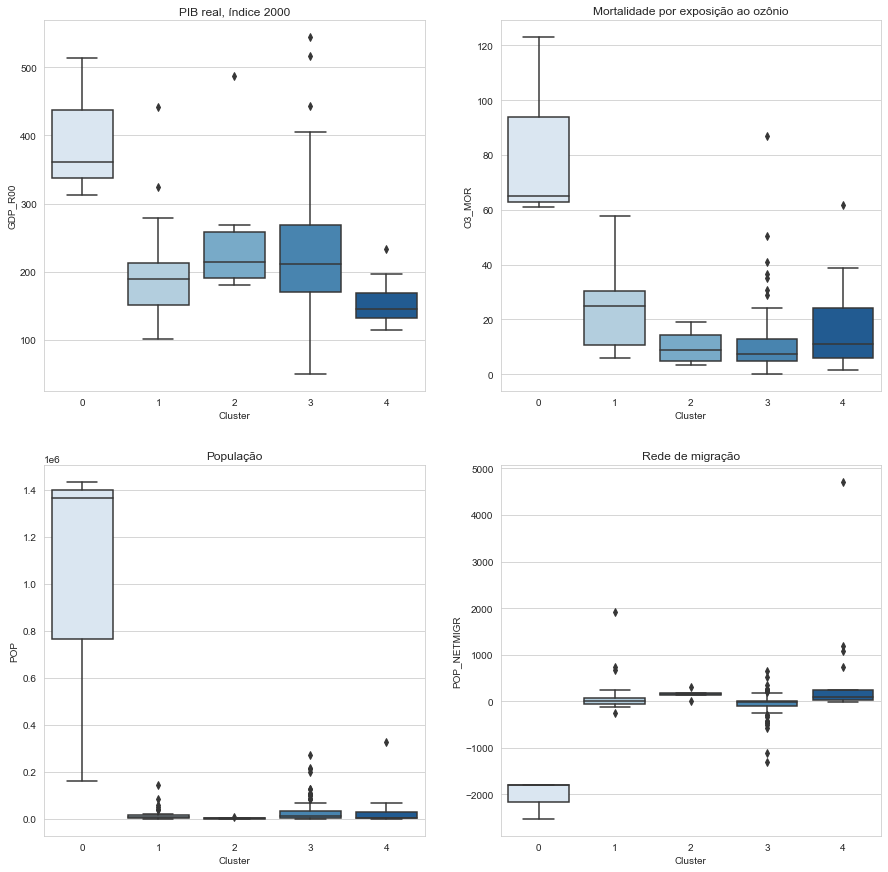

In [158]:
fig, ax = plt.subplots(2,2, figsize=(15,15))
sns.boxplot(data=df_kmeans, x='Cluster', y='GDP_R00',ax=ax[0,0], palette='Blues').set_title('PIB real, índice 2000');
sns.boxplot(data=df_kmeans, x='Cluster', y='O3_MOR',ax=ax[0,1], palette='Blues').set_title('Mortalidade por exposição ao ozônio');
sns.boxplot(data=df_kmeans, x='Cluster', y='POP',ax=ax[1,0], palette='Blues').set_title('População');
sns.boxplot(data=df_kmeans, x='Cluster', y='POP_NETMIGR',ax=ax[1,1], palette='Blues').set_title('Rede de migração');

### Cluster 1

#### O cluster 1 é composto por 29 países, sendo a maioria deles ex-membros da extinta URSS (União das Repúblicas Socialistas Soviéticas), com algumas exceções como Grécia e Coréia, por exemplo. Muitos destes países enfrentam uma realidade ambiental muito deteriorada desde a queda da URSS. 

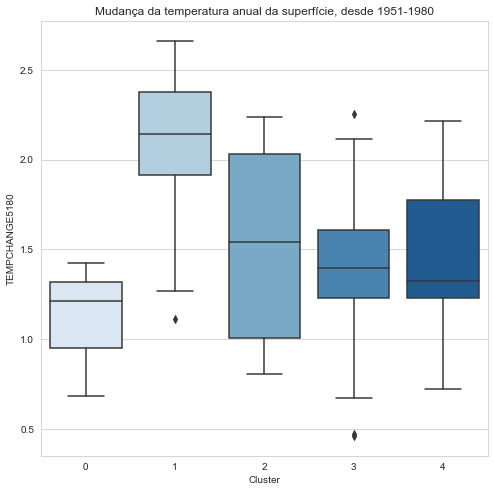

In [154]:
plt.figure(figsize=(8,8))
sns.boxplot(data=df_kmeans, x='Cluster', y='TEMPCHANGE5180', palette='Blues').set_title('Mudança da temperatura anual da superfície, desde 1951-1980');

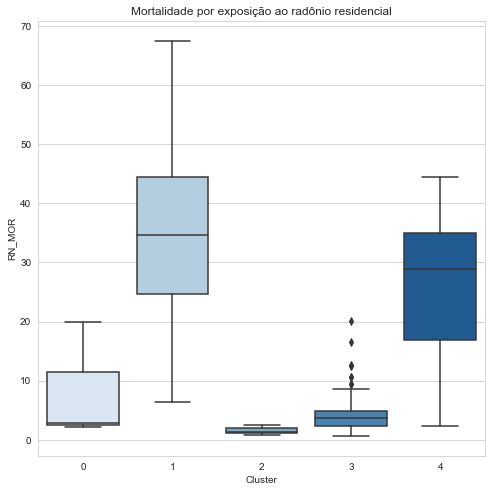

In [161]:
plt.figure(figsize=(8,8))
sns.boxplot(data=df_kmeans, x='Cluster', y='RN_MOR', palette='Blues').set_title('Mortalidade por exposição ao radônio residencial');

### Cluster 2

#### O cluster 2 é composto por seis países, sendo eles Catar, Emirados Árabes Unidos, Bahrein, Kuwait, Omã e Maldivas. Com exceção das Maldivas, todos os países desse cluster são do Oriente Médio. De acordo com os indicadores analisados, os maiores pontos de similaridade entre esses países são de cunho demográfico.

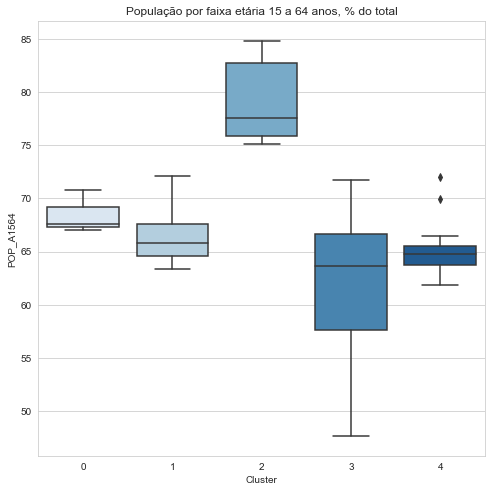

In [162]:
plt.figure(figsize=(8,8))
sns.boxplot(data=df_kmeans, x='Cluster', y='POP_A1564', palette='Blues').set_title('População por faixa etária 15 a 64 anos, % do total');

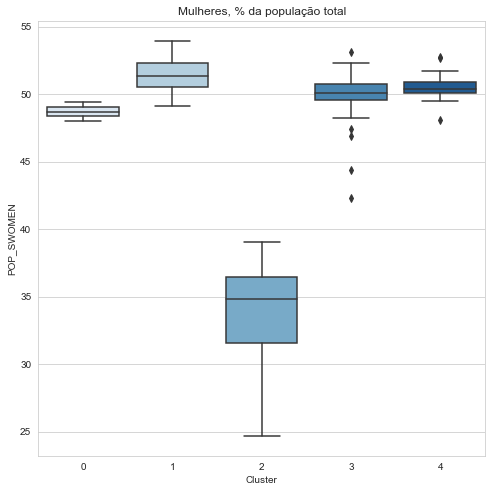

In [159]:
plt.figure(figsize=(8,8))
sns.boxplot(data=df_kmeans, x='Cluster', y='POP_SWOMEN', palette='Blues').set_title('Mulheres, % da população total');

### Cluster 3

#### O cluster 3 foi o que agrupou a maior quantidade de países, totalizando 96 países. Majoritariamente esses países são do que estudos pós-coloniais e transnacionais chamam de Sul Global. São, no geral, economias subdesenvolvidas ou em desenvolvimento, agroexportadoras, com baixa emissão de carbono e que têm uma estrutura social e econômica com grandes desigualdades em padrões de vida, expectativa de vida ou acesso a recursos. Os dados desse cluster apresentaram maior variabilidade se comparados aos demais, por possuir uma quantidade significativamente maior de instâncias.

### Cluster 4

#### Por fim, o cluster 4 agrupou 19 países. Entre eles EUA, Canadá, Austrália e países da Europa Ocidental. Países ricos, com acesso a tecnologias avançadas, sistemas políticos estáveis e alta expectativa de vida. O principal insight proveniente da análise dos dados desse cluster foi a baixa taxa de exposição a partículas com concentrações anuais que excedem 10 microgramas por metro cúbico.

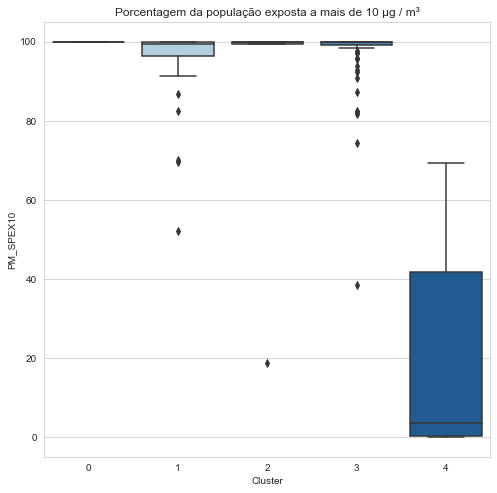

In [156]:
plt.figure(figsize=(8,8))
sns.boxplot(data=df_kmeans, x='Cluster', y='PM_SPEX10', palette='Blues').set_title('Porcentagem da população exposta a mais de 10 µg / m³');